# Convolutional Neural Networks

## Project: Write an Algorithm for a Dog Identification App 

---

In this notebook, some template code has already been provided for you, and you will need to implement additional functionality to successfully complete this project. You will not need to modify the included code beyond what is requested. Sections that begin with **'(IMPLEMENTATION)'** in the header indicate that the following block of code will require additional functionality which you must provide. Instructions will be provided for each section, and the specifics of the implementation are marked in the code block with a 'TODO' statement. Please be sure to read the instructions carefully! 

> **Note**: Once you have completed all of the code implementations, you need to finalize your work by exporting the Jupyter Notebook as an HTML document. Before exporting the notebook to html, all of the code cells need to have been run so that reviewers can see the final implementation and output. You can then export the notebook by using the menu above and navigating to **File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question X'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut.  Markdown cells can be edited by double-clicking the cell to enter edit mode.

The rubric contains _optional_ "Stand Out Suggestions" for enhancing the project beyond the minimum requirements. If you decide to pursue the "Stand Out Suggestions", you should include the code in this Jupyter notebook.



---
### Why We're Here 

In this notebook, you will make the first steps towards developing an algorithm that could be used as part of a mobile or web app.  At the end of this project, your code will accept any user-supplied image as input.  If a dog is detected in the image, it will provide an estimate of the dog's breed.  If a human is detected, it will provide an estimate of the dog breed that is most resembling.  The image below displays potential sample output of your finished project (... but we expect that each student's algorithm will behave differently!). 

![Sample Dog Output](images/sample_dog_output.png)

In this real-world setting, you will need to piece together a series of models to perform different tasks; for instance, the algorithm that detects humans in an image will be different from the CNN that infers dog breed.  There are many points of possible failure, and no perfect algorithm exists.  Your imperfect solution will nonetheless create a fun user experience!

### The Road Ahead

We break the notebook into separate steps.  Feel free to use the links below to navigate the notebook.

* [Step 0](#step0): Import Datasets
* [Step 1](#step1): Detect Humans
* [Step 2](#step2): Detect Dogs
* [Step 3](#step3): Create a CNN to Classify Dog Breeds (from Scratch)
* [Step 4](#step4): Create a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 5](#step5): Write your Algorithm
* [Step 6](#step6): Test Your Algorithm

---
<a id='step0'></a>
## Step 0: Import Datasets

Make sure that you've downloaded the required human and dog datasets:

**Note: if you are using the Udacity workspace, you *DO NOT* need to re-download these - they can be found in the `/data` folder as noted in the cell below.**

* Download the [dog dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/dogImages.zip).  Unzip the folder and place it in this project's home directory, at the location `/dog_images`. 

* Download the [human dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/lfw.zip).  Unzip the folder and place it in the home directory, at location `/lfw`.  

*Note: If you are using a Windows machine, you are encouraged to use [7zip](http://www.7-zip.org/) to extract the folder.*

In the code cell below, we save the file paths for both the human (LFW) dataset and dog dataset in the numpy arrays `human_files` and `dog_files`.

In [7]:
# Set this here to avoid problems linked to truncated images later on
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [8]:
import numpy as np
from glob import glob

# set ENV='udacity' if working in the udacity workspace
ENV='udacity'

# load filenames for human and dog images
if ENV == 'udacity':
    human_files = np.array(glob("/data/lfw/*/*"))
    dog_files = np.array(glob("/data/dog_images/*/*/*"))
else:
    human_files = np.array(glob("human_files/*/*"))
    dog_files = np.array(glob("dog_images/*/*/*"))

# print number of images in each dataset
print('There are %d total human images.' % len(human_files))
print('There are %d total dog images.' % len(dog_files))

There are 13233 total human images.
There are 8351 total dog images.


In [9]:
# statistics about the number of images per class in the dog dataset
import pandas as pd

nb_files = {'train': {}, 'test': {}, 'valid':{}}
for file in dog_files:
    data_folder, dataset, class_id, img = file.split("/")[-4:]
    if class_id in nb_files[dataset].keys():
        nb_files[dataset][class_id] += 1
    else:
        nb_files[dataset][class_id] = 1
df = pd.DataFrame(nb_files)
print(df.head())

                      train  test  valid
001.Affenpinscher        64     8      8
002.Afghan_hound         58     8      7
003.Airedale_terrier     52     6      7
004.Akita                63     8      8
005.Alaskan_malamute     77    10      9


In [10]:
print(f"{df.shape[0]} classes in the dog dataset")

133 classes in the dog dataset


In [11]:
# display total number of images in train, test and validation sets
print(df.sum(axis=0))
print(f"{sum(df.sum(axis=0))} images in total.")

train    6680
test      836
valid     835
dtype: int64
8351 images in total.


            train        test       valid
count  133.000000  133.000000  133.000000
mean    50.225564    6.285714    6.278195
std     11.863885    1.712571    1.350384
min     26.000000    3.000000    4.000000
25%     42.000000    5.000000    6.000000
50%     50.000000    6.000000    6.000000
75%     61.000000    8.000000    7.000000
max     77.000000   10.000000    9.000000


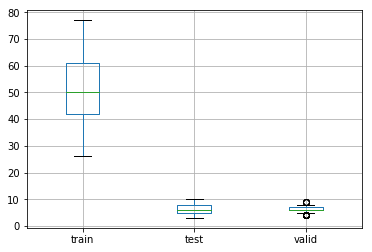

In [12]:
import matplotlib.pyplot as plt  
%matplotlib inline   

# display statistics about dog dataset
print(df.describe())
# display statistics as boxplot
df.boxplot()
plt.show()

<a id='step1'></a>
## Step 1: Detect Humans

In this section, we use OpenCV's implementation of [Haar feature-based cascade classifiers](http://docs.opencv.org/trunk/d7/d8b/tutorial_py_face_detection.html) to detect human faces in images.  

OpenCV provides many pre-trained face detectors, stored as XML files on [github](https://github.com/opencv/opencv/tree/master/data/haarcascades).  We have downloaded one of these detectors and stored it in the `haarcascades` directory.  In the next code cell, we demonstrate how to use this detector to find human faces in a sample image.

Number of faces detected: 1


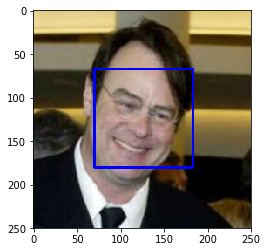

In [13]:
import cv2                                                                 

# extract pre-trained face detector
face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt.xml')

# load color (BGR) image
img = cv2.imread(human_files[0])
# convert BGR image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# find faces in image
faces = face_cascade.detectMultiScale(gray)

# print number of faces detected in the image
print('Number of faces detected:', len(faces))

# get bounding box for each detected face
for (x,y,w,h) in faces:
    # add bounding box to color image
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    
# convert BGR image to RGB for plotting
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# display the image, along with bounding box
plt.imshow(cv_rgb)
plt.show()

Before using any of the face detectors, it is standard procedure to convert the images to grayscale.  The `detectMultiScale` function executes the classifier stored in `face_cascade` and takes the grayscale image as a parameter.  

In the above code, `faces` is a numpy array of detected faces, where each row corresponds to a detected face.  Each detected face is a 1D array with four entries that specifies the bounding box of the detected face.  The first two entries in the array (extracted in the above code as `x` and `y`) specify the horizontal and vertical positions of the top left corner of the bounding box.  The last two entries in the array (extracted here as `w` and `h`) specify the width and height of the box.

### Write a Human Face Detector

We can use this procedure to write a function that returns `True` if a human face is detected in an image and `False` otherwise.  This function, aptly named `face_detector`, takes a string-valued file path to an image as input and appears in the code block below.

In [14]:
# returns "True" if face is detected in image stored at img_path
def face_detector(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    return len(faces) > 0

### (IMPLEMENTATION) Assess the Human Face Detector

__Question 1:__ Use the code cell below to test the performance of the `face_detector` function.  
- What percentage of the first 100 images in `human_files` have a detected human face?  
- What percentage of the first 100 images in `dog_files` have a detected human face? 

Ideally, we would like 100% of human images with a detected face and 0% of dog images with a detected face.  You will see that our algorithm falls short of this goal, but still gives acceptable performance.  We extract the file paths for the first 100 images from each of the datasets and store them in the numpy arrays `human_files_short` and `dog_files_short`.

__Answer:__ 
(You can print out your results and/or write your percentages in this cell)

In [15]:
from tqdm import tqdm

human_files_short = human_files[:100]
dog_files_short = dog_files[:100]

#-#-# Do NOT modify the code above this line. #-#-#

## TODO: Test the performance of the face_detector algorithm 
## on the images in human_files_short and dog_files_short.
nb_faces_human = sum([face_detector(file) for file in human_files_short])
nb_faces_dogs = sum([face_detector(file) for file in dog_files_short])

print(f"{nb_faces_human}% of detected human faces in the first 100 entries of the human dataset")
print(f"{nb_faces_dogs}% of detected human faces in the first 100 entries of the dog dataset")

98% of detected human faces in the first 100 entries of the human dataset
17% of detected human faces in the first 100 entries of the dog dataset


We suggest the face detector from OpenCV as a potential way to detect human images in your algorithm, but you are free to explore other approaches, especially approaches that make use of deep learning :).  Please use the code cell below to design and test your own face detection algorithm.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

In [16]:
### (Optional) 
### TODO: Test performance of anotherface detection algorithm.
### Feel free to use as many code cells as needed.

---
<a id='step2'></a>
## Step 2: Detect Dogs

In this section, we use a [pre-trained model](http://pytorch.org/docs/master/torchvision/models.html) to detect dogs in images.  

### Obtain Pre-trained VGG-16 Model

The code cell below downloads the VGG-16 model, along with weights that have been trained on [ImageNet](http://www.image-net.org/), a very large, very popular dataset used for image classification and other vision tasks.  ImageNet contains over 10 million URLs, each linking to an image containing an object from one of [1000 categories](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a).  

In [17]:
import torch
import torchvision.models as models

# define VGG16 model
VGG16 = models.vgg16(pretrained=True)

# check if CUDA is available
use_cuda = torch.cuda.is_available()

# move model to GPU if CUDA is available
if use_cuda:
    VGG16 = VGG16.cuda()
    


Given an image, this pre-trained VGG-16 model returns a prediction (derived from the 1000 possible categories in ImageNet) for the object that is contained in the image.

### (IMPLEMENTATION) Making Predictions with a Pre-trained Model

In the next code cell, you will write a function that accepts a path to an image (such as `'dogImages/train/001.Affenpinscher/Affenpinscher_00001.jpg'`) as input and returns the index corresponding to the ImageNet class that is predicted by the pre-trained VGG-16 model.  The output should always be an integer between 0 and 999, inclusive.

Before writing the function, make sure that you take the time to learn  how to appropriately pre-process tensors for pre-trained models in the [PyTorch documentation](http://pytorch.org/docs/stable/torchvision/models.html).

In [18]:
from PIL import Image
import torchvision.transforms as transforms

def VGG16_predict(img_path):
    '''
    Use pre-trained VGG-16 model to obtain index corresponding to 
    predicted ImageNet class for image at specified path
    
    Args:
        img_path: path to an image
        
    Returns:
        Index corresponding to VGG-16 model's prediction
    '''
    
    ## TODO: Complete the function.
    ## Load and pre-process an image from the given img_path
    
    # Load image
    img = Image.open(img_path)
    
    # Define the pre-processing steps that will be applied to the image
    transform = transforms.Compose([
        transforms.Resize(256), # Resize the image to 256x256 pixels
        transforms.CenterCrop(224), # Keep a 224x224 zone around the center
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], # Normalize using values advised in pytorch documentation
                             std=[0.229, 0.224, 0.225]),
    ])
    

    # Pre-process the image
    preprocessed_img = transform(img)

    if use_cuda:
        preprocessed_img = preprocessed_img.to('cuda')

    input_img = torch.unsqueeze(preprocessed_img, 0) # add a "batch" dimension to fit expected input format
    
    # Switch model to inference (evaluation) mode
    VGG16.eval()
    
    # Predict image's class
    prediction = VGG16(input_img)

    ## Return the *index* of the predicted class for that image
    prediction = prediction.cpu()
    prediction = prediction.data.numpy().argmax()
    return prediction

VGG16_predict(dog_files[0])


243

### (IMPLEMENTATION) Write a Dog Detector

While looking at the [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a), you will notice that the categories corresponding to dogs appear in an uninterrupted sequence and correspond to dictionary keys 151-268, inclusive, to include all categories from `'Chihuahua'` to `'Mexican hairless'`.  Thus, in order to check to see if an image is predicted to contain a dog by the pre-trained VGG-16 model, we need only check if the pre-trained model predicts an index between 151 and 268 (inclusive).

Use these ideas to complete the `dog_detector` function below, which returns `True` if a dog is detected in an image (and `False` if not).


In [19]:
### returns "True" if a dog is detected in the image stored at img_path
def dog_detector(img_path):
    ## TODO: Complete the function.
    predicted_class = VGG16_predict(img_path)
    return predicted_class >= 151 and predicted_class <= 268


### (IMPLEMENTATION) Assess the Dog Detector

__Question 2:__ Use the code cell below to test the performance of your `dog_detector` function.  
- What percentage of the images in `human_files_short` have a detected dog?  
- What percentage of the images in `dog_files_short` have a detected dog?

__Answer:__ 


In [20]:
### TODO: Test the performance of the dog_detector function
### on the images in human_files_short and dog_files_short.
nb_dogs_human = sum([dog_detector(file) for file in human_files_short])
nb_dogs_dogs = sum([dog_detector(file) for file in dog_files_short])

print(f"{nb_dogs_human}% of detected dogs in the first 100 entries of the human dataset")
print(f"{nb_dogs_dogs}% of detected dogs in the first 100 entries of the dog dataset")

0% of detected dogs in the first 100 entries of the human dataset
100% of detected dogs in the first 100 entries of the dog dataset


We suggest VGG-16 as a potential network to detect dog images in your algorithm, but you are free to explore other pre-trained networks (such as [Inception-v3](http://pytorch.org/docs/master/torchvision/models.html#inception-v3), [ResNet-50](http://pytorch.org/docs/master/torchvision/models.html#id3), etc).  Please use the code cell below to test other pre-trained PyTorch models.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

In [21]:
### (Optional) 
### TODO: Report the performance of another pre-trained network.
### Feel free to use as many code cells as needed.

---
<a id='step3'></a>
## Step 3: Create a CNN to Classify Dog Breeds (from Scratch)

Now that we have functions for detecting humans and dogs in images, we need a way to predict breed from images.  In this step, you will create a CNN that classifies dog breeds.  You must create your CNN _from scratch_ (so, you can't use transfer learning _yet_!), and you must attain a test accuracy of at least 10%.  In Step 4 of this notebook, you will have the opportunity to use transfer learning to create a CNN that attains greatly improved accuracy.

We mention that the task of assigning breed to dogs from images is considered exceptionally challenging.  To see why, consider that *even a human* would have trouble distinguishing between a Brittany and a Welsh Springer Spaniel.  

Brittany | Welsh Springer Spaniel
- | - 
<img src="images/Brittany_02625.jpg" width="100"> | <img src="images/Welsh_springer_spaniel_08203.jpg" width="200">

It is not difficult to find other dog breed pairs with minimal inter-class variation (for instance, Curly-Coated Retrievers and American Water Spaniels).  

Curly-Coated Retriever | American Water Spaniel
- | -
<img src="images/Curly-coated_retriever_03896.jpg" width="200"> | <img src="images/American_water_spaniel_00648.jpg" width="200">


Likewise, recall that labradors come in yellow, chocolate, and black.  Your vision-based algorithm will have to conquer this high intra-class variation to determine how to classify all of these different shades as the same breed.  

Yellow Labrador | Chocolate Labrador | Black Labrador
- | -
<img src="images/Labrador_retriever_06457.jpg" width="150"> | <img src="images/Labrador_retriever_06455.jpg" width="240"> | <img src="images/Labrador_retriever_06449.jpg" width="220">

We also mention that random chance presents an exceptionally low bar: setting aside the fact that the classes are slightly imabalanced, a random guess will provide a correct answer roughly 1 in 133 times, which corresponds to an accuracy of less than 1%.  

Remember that the practice is far ahead of the theory in deep learning.  Experiment with many different architectures, and trust your intuition.  And, of course, have fun!

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dog_images/train`, `dog_images/valid`, and `dog_images/test`, respectively).  You may find [this documentation on custom datasets](http://pytorch.org/docs/stable/torchvision/datasets.html) to be a useful resource.  If you are interested in augmenting your training and/or validation data, check out the wide variety of [transforms](http://pytorch.org/docs/stable/torchvision/transforms.html?highlight=transform)!

In [22]:
import os
from torchvision import datasets

### TODO: Write data loaders for training, validation, and test sets
## Specify appropriate transforms, and batch_sizes

# Define datasets directories
if ENV == 'udacity':
    train_dir = glob('/data/dog_images/train/')[0]
    valid_dir = glob('/data/dog_images/valid/')[0]
    test_dir = glob('/data/dog_images/test/')[0]
else:
    train_dir = glob('dog_images/train/')[0]
    valid_dir = glob('dog_images/valid/')[0]
    test_dir = glob('dog_images/test/')[0] 
# Define transforms used for pre-processing images
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

transform_train = transforms.Compose([
            transforms.RandomResizedCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(),
            normalize  
])

transform_eval = transforms.Compose([
        transforms.Resize(256), # Resize the image to 256x256 pixels
        transforms.CenterCrop(224), # Keep a 224x224 zone around the center
        transforms.ToTensor(),
        normalize
])

# Build datasets
train_dataset = datasets.ImageFolder(train_dir, transform_train)
test_dataset = datasets.ImageFolder(test_dir, transform_eval)
valid_dataset = datasets.ImageFolder(valid_dir, transform_eval)

# Load datasets
batch_size = 64
num_workers = 0 if use_cuda else 4 # Pytorch's dataloader doc advises against using multiprocessing in GPU mode
pin_memory = False if use_cuda else False # In GPU mode, enable pin_memory instead of multiprocessing

train_data_loader = torch.utils.data.DataLoader(train_dataset,
                                          batch_size=batch_size,
                                          shuffle=True,
                                          num_workers=num_workers,
                                          pin_memory = pin_memory)
test_data_loader = torch.utils.data.DataLoader(test_dataset,
                                          batch_size=batch_size,
                                          num_workers=num_workers,
                                          pin_memory = pin_memory)
valid_data_loader = torch.utils.data.DataLoader(valid_dataset,
                                          batch_size=batch_size,
                                          num_workers=num_workers,
                                          pin_memory = pin_memory)
loaders_scratch = {
    'train': train_data_loader,
    'valid': valid_data_loader,
    'test': test_data_loader
}

**Question 3:** Describe your chosen procedure for preprocessing the data. 
- How does your code resize the images (by cropping, stretching, etc)?  What size did you pick for the input tensor, and why?
- Did you decide to augment the dataset?  If so, how (through translations, flips, rotations, etc)?  If not, why not?


**Answer**: I resized images in all three datasets to 224x224 px by first resizing the images then cropping to the target size. I picked a batch size of 64 for my first attempt. I researched possible values on pytorch forumss and found that batch sizes are often set betwwen 64 and 256 (https://discuss.pytorch.org/t/generic-question-about-batch-sizes/1321). Several examples of dog breed classification I found on the net use the value 64 (e.g. https://www.kaggle.com/waterchiller/vgg16-classification-dog-breed).
For a first attempt, I decided to randomly crop and randomly flip horizontally images in the train dataset. I will revisit this choice of data augmentation processes if the model's accuracy is below the 10% threshold.

### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  Use the template in the code cell below.

In [23]:
# Useful functions to compute the input number of neurones in the 1st fully connected layer

def output_dim_conv(input_img_size, kernel_size, padding ,stride):
    ''' Compute the output dimension of an image after passing through
        a convolutional layer
        input_img_size: int, image size in pixel (x for an x*x image)
        kernel_size: int, kernel size (x for an x*x matrix)
        padding: int, layer's padding value
        stride: int, layer's stride value
    '''
    return 1+(input_img_size - kernel_size + 2 * padding)/stride

def output_dim_maxpool(input_img_size, pool_size, stride):
    ''' Compute the output dimension of an image after passing through
        a maxpooling layer
        input_img_size: int, image size in pixel (x for an x*x image)
        pool_size: int, pooling matrix size (x for an x*x matrix)
        stride: int, layer's stride value
    '''
    return 1+ (input_img_size - pool_size) / stride

In [24]:
import torch.nn as nn
import torch.nn.functional as F

# define the CNN architecture
class Net(nn.Module):
    ### TODO: choose an architecture, and complete the class
    def __init__(self):
        super(Net, self).__init__()
        ## Define layers of a CNN
        
        # convolutional layers
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1)

        # max pooling layer
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # fully connected layers
        # after last maxpooling, the dimension of images is 7px*7px*256 channels
        self.fc1 = nn.Linear(7 * 7 * 256, 2048)
        self.fc2 = nn.Linear(2048, 133) # We have 133 classes representing dog breeds
        
        # dropout regularization
        self.dropout = nn.Dropout(p=0.2)
    
    def forward(self, x):
        ## Define forward behavior
        x = F.relu(self.conv1(x))
        x = self.maxpool(x)
        x = F.relu(self.conv2(x))
        x = self.maxpool(x)
        x = F.relu(self.conv3(x))
        x = self.maxpool(x)
        
        # flatten
        x = x.reshape(x.size(0), -1)
        
        x = self.dropout(x)
        x = F.relu(self.fc1(x))
        
        x = self.dropout(x)
        x = self.fc2(x)
        return x

#-#-# You so NOT have to modify the code below this line. #-#-#

# instantiate the CNN
model_scratch = Net()

# move tensors to GPU if CUDA is available
if use_cuda:
    model_scratch.cuda()

__Question 4:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  

__Answer:__ I chose a simple CNN architecture with only 3 convolution units (convolution + Relu activation + max pooling) and 2 fully connected layers. I built a simple network based on the architecture of VGG16: https://www.jeremyjordan.me/convnet-architectures/#vgg16.
A quick google search of CNN used to classify dog breeds showed me that similar simple architectures could achieve an accuracy > 10%.

1st model: 3 convolutional layers with output channels = 64, 128, 256 respectively, padding=1 and stride=1. Maxpooling with pool size=2 and stride=2 after each convolutional unit. 2 fully connected layers, preceded by dropout layer with default value (0.5). The output number of neurones for the first layer is set to 4096.

Result: Out of memory error...

2nd model: Let's decrease dimensionality by using a stride=2 for the 3 convolutional layers and by using 2048 output neurones instead of 4096 in the firt fully connected layer.

Result: Test Accuracy: 10% (86/836).

3rd model: Let's see if we can do better by increasing dimensionality. Let's set stride=1 for the 3rd convolutional layer. Let's also decrease the probability of dropout, p=0.2.

Result: Test Accuracy: 13% (117/836). Good enough!

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/stable/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/stable/optim.html).  Save the chosen loss function as `criterion_scratch`, and the optimizer as `optimizer_scratch` below.

In [25]:
import torch.optim as optim

### TODO: select loss function
criterion_scratch = nn.CrossEntropyLoss() # This criterion combines nn.LogSoftmax() and nn.NLLLoss() in one single class.

### TODO: select optimizer
# gradient descent with learning rate = 0.01 and momentum = 0.9
optimizer_scratch = optim.SGD(model_scratch.parameters(), lr=0.01, momentum=0.9)

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_scratch.pt'`.

In [26]:
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

def train(n_epochs, loaders, model, optimizer, criterion, use_cuda, save_path):
    """returns trained model"""
    # initialize tracker for minimum validation loss
    valid_loss_min = np.Inf 
    
    for epoch in range(1, n_epochs+1):
        # initialize variables to monitor training and validation loss
        train_loss = 0.0
        valid_loss = 0.0
        
        ###################
        # train the model #
        ###################
        model.train()
        for batch_idx, (data, target) in enumerate(loaders['train']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            ## find the loss and update the model parameters accordingly
            ## record the average training loss, using something like
            ## train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.data - train_loss))

            # zero the parameter gradients
            optimizer.zero_grad()

            # forward + backward + optimize
            outputs = model(data)
            loss = criterion(outputs, target)
            loss.backward()
            optimizer.step()
            
            # record average training loss
            train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.data - train_loss))
           
            
        ######################    
        # validate the model #
        ######################
        model.eval()
        for batch_idx, (data, target) in enumerate(loaders['valid']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            ## update the average validation loss
            outputs = model(data)
            loss = criterion(outputs, target)
            valid_loss = valid_loss + ((1 / (batch_idx + 1)) * (loss.data - valid_loss))            
            
        # print training/validation statistics 
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
            epoch, 
            train_loss,
            valid_loss
            ))
        
        ## TODO: save the model if validation loss has decreased
        if epoch == 1 or valid_loss < valid_loss_min:
            print(f"Save model (validation loss = {valid_loss:0.3f}, previous min was {valid_loss_min:0.3f})")
            torch.save(model.state_dict(), save_path)
            valid_loss_min = valid_loss
            
    # return trained model
    return model

In [20]:
# train the model
model_scratch = train(20, loaders_scratch, model_scratch, optimizer_scratch, criterion_scratch, use_cuda, 'model_scratch.pt')

# load the model that got the best validation accuracy
model_scratch.load_state_dict(torch.load('model_scratch.pt'))

Epoch: 1 	Training Loss: 4.866826 	Validation Loss: 4.832030
Save model (validation loss = 4.832, previous min was inf)
Epoch: 2 	Training Loss: 4.774156 	Validation Loss: 4.644499
Save model (validation loss = 4.644, previous min was 4.832)
Epoch: 3 	Training Loss: 4.631898 	Validation Loss: 4.457463
Save model (validation loss = 4.457, previous min was 4.644)
Epoch: 4 	Training Loss: 4.539420 	Validation Loss: 4.405096
Save model (validation loss = 4.405, previous min was 4.457)
Epoch: 5 	Training Loss: 4.455003 	Validation Loss: 4.321347
Save model (validation loss = 4.321, previous min was 4.405)
Epoch: 6 	Training Loss: 4.384246 	Validation Loss: 4.241851
Save model (validation loss = 4.242, previous min was 4.321)
Epoch: 7 	Training Loss: 4.319590 	Validation Loss: 4.174611
Save model (validation loss = 4.175, previous min was 4.242)
Epoch: 8 	Training Loss: 4.260578 	Validation Loss: 4.162782
Save model (validation loss = 4.163, previous min was 4.175)
Epoch: 9 	Training Loss: 4

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images.  Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 10%.

In [37]:
def test(loaders, model, criterion, use_cuda):

    # monitor test loss and accuracy
    test_loss = 0.
    correct = 0.
    total = 0.

    model.eval()
    for batch_idx, (data, target) in enumerate(loaders['test']):
        # move to GPU
        if use_cuda:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the loss
        loss = criterion(output, target)
        # update average test loss 
        test_loss = test_loss + ((1 / (batch_idx + 1)) * (loss.data - test_loss))
        # convert output probabilities to predicted class
        pred = output.data.max(1, keepdim=True)[1]
        # compare predictions to true label
        correct += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
        total += data.size(0)
            
    print('Test Loss: {:.6f}\n'.format(test_loss))

    print('\nTest Accuracy: %2d%% (%2d/%2d)' % (
        100. * correct / total, correct, total))

In [21]:
# call test function    
test(loaders_scratch, model_scratch, criterion_scratch, use_cuda)

Test Loss: 3.598638


Test Accuracy: 15% (129/836)


---
<a id='step4'></a>
## Step 4: Create a CNN to Classify Dog Breeds (using Transfer Learning)

You will now use transfer learning to create a CNN that can identify dog breed from images.  Your CNN must attain at least 60% accuracy on the test set.

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/master/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dogImages/train`, `dogImages/valid`, and `dogImages/test`, respectively). 

If you like, **you are welcome to use the same data loaders from the previous step**, when you created a CNN from scratch.

In [27]:
## TODO: Specify data loaders
loaders_transfer = loaders_scratch.copy()

### (IMPLEMENTATION) Model Architecture

Use transfer learning to create a CNN to classify dog breed.  Use the code cell below, and save your initialized model as the variable `model_transfer`.

In [28]:
import torchvision.models as models
import torch.nn as nn

## TODO: Specify model architecture

model_transfer = models.vgg16(pretrained=True)
print(model_transfer)

# freeze parameters
for param in model_transfer.features.parameters():
    param.requires_grad = False

# replace classifier
model_transfer.classifier[6] = nn.Linear(4096,133,bias=True) # replace vgg16's last classifier 

print(model_transfer)

if use_cuda:
    model_transfer = model_transfer.cuda()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (17): Conv2d

__Question 5:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  Describe why you think the architecture is suitable for the current problem.

__Answer:__ 
I started with the smallest possible modification of the architecture: I replaced the last fully connected layer with another fully connected layer with 133 output neurones (the number of dog labels) instead of 1000. 

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/master/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/master/optim.html).  Save the chosen loss function as `criterion_transfer`, and the optimizer as `optimizer_transfer` below.

In [29]:
import torch.nn as nn
import torch.optim as optim

criterion_transfer = nn.CrossEntropyLoss()
optimizer_transfer = optim.SGD(model_transfer.classifier[6].parameters(), lr=0.001)

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_transfer.pt'`.

In [30]:
# train the model
model_transfer = train(20, loaders_transfer, model_transfer, optimizer_transfer, criterion_transfer, use_cuda, 'model_transfer.pt')

# load the model that got the best validation accuracy (uncomment the line below)
model_transfer.load_state_dict(torch.load('model_transfer.pt'))

Epoch: 1 	Training Loss: 4.784271 	Validation Loss: 4.312833
Save model (validation loss = 4.313, previous min was inf)
Epoch: 2 	Training Loss: 4.250200 	Validation Loss: 3.768997
Save model (validation loss = 3.769, previous min was 4.313)
Epoch: 3 	Training Loss: 3.808261 	Validation Loss: 3.303732
Save model (validation loss = 3.304, previous min was 3.769)
Epoch: 4 	Training Loss: 3.436376 	Validation Loss: 2.922985
Save model (validation loss = 2.923, previous min was 3.304)
Epoch: 5 	Training Loss: 3.108205 	Validation Loss: 2.611647
Save model (validation loss = 2.612, previous min was 2.923)
Epoch: 6 	Training Loss: 2.865873 	Validation Loss: 2.353890
Save model (validation loss = 2.354, previous min was 2.612)
Epoch: 7 	Training Loss: 2.650922 	Validation Loss: 2.142007
Save model (validation loss = 2.142, previous min was 2.354)
Epoch: 8 	Training Loss: 2.479392 	Validation Loss: 1.964744
Save model (validation loss = 1.965, previous min was 2.142)
Epoch: 9 	Training Loss: 2

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images. Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 60%.

In [38]:
test(loaders_transfer, model_transfer, criterion_transfer, use_cuda)

Test Loss: 1.029495


Test Accuracy: 80% (671/836)


### (IMPLEMENTATION) Predict Dog Breed with the Model

Write a function that takes an image path as input and returns the dog breed (`Affenpinscher`, `Afghan hound`, etc) that is predicted by your model.  

In [39]:
from PIL import Image
import torchvision.transforms as transforms

### TODO: Write a function that takes a path to an image as input
### and returns the dog breed that is predicted by the model.

# list of class names by index, i.e. a name can be accessed like class_names[0]
class_names = [item[4:].replace("_", " ") for item in loaders_transfer['train'].dataset.classes]

# write class names to a file for later use in the web app
with open('class_names_transfer.txt', 'w') as f:
    for item in class_names:
        f.write("%s\n" % item)

def predict_breed_transfer(img_path):
    # load the image and return the predicted breed
    # Load image
    img = Image.open(img_path)
    
    # Define the pre-processing steps that will be applied to the image
    transform = transforms.Compose([
        transforms.Resize(256), # Resize the image to 256x256 pixels
        transforms.CenterCrop(224), # Keep a 224x224 zone around the center
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], # Normalize using values advised in pytorch documentation
                             std=[0.229, 0.224, 0.225]),
    ])
    

    # Pre-process the image
    preprocessed_img = transform(img)

    if use_cuda:
        preprocessed_img = preprocessed_img.to('cuda')

    input_img = torch.unsqueeze(preprocessed_img, 0) # add a "batch" dimension to fit expected input format
    
    # Switch model to inference (evaluation) mode
    model_transfer.eval()
    
    # Predict image's class
    prediction = model_transfer(input_img)
    prediction = prediction.cpu()
    prediction = prediction.data.numpy().argmax()
    return class_names[prediction]

predict_breed_transfer(dog_files[0])

'Bullmastiff'

---
<a id='step5'></a>
## Step 5: Write your Algorithm

Write an algorithm that accepts a file path to an image and first determines whether the image contains a human, dog, or neither.  Then,
- if a __dog__ is detected in the image, return the predicted breed.
- if a __human__ is detected in the image, return the resembling dog breed.
- if __neither__ is detected in the image, provide output that indicates an error.

You are welcome to write your own functions for detecting humans and dogs in images, but feel free to use the `face_detector` and `human_detector` functions developed above.  You are __required__ to use your CNN from Step 4 to predict dog breed.  

Some sample output for our algorithm is provided below, but feel free to design your own user experience!

![Sample Human Output](images/sample_human_output.png)


### (IMPLEMENTATION) Write your Algorithm

In [42]:
### TODO: Write your algorithm.
### Feel free to use as many code cells as needed.

from IPython.display import display 


def run_app(img_path):
    ## handle cases for a human face, dog, and neither
    # display image
    img = Image.open(img_path)
    display(img)
    if dog_detector(img_path):
        dog = predict_breed_transfer(img_path)
        print(f"I think that this dog is a ... {dog}.")
    elif face_detector(img_path):
        dog = predict_breed_transfer(img_path)
        print(f"Hello human! If you were a dog, you would be a ... {dog}")
    else:
        print("No dog or human detected.")    


---
<a id='step6'></a>
## Step 6: Test Your Algorithm

In this section, you will take your new algorithm for a spin!  What kind of dog does the algorithm think that _you_ look like?  If you have a dog, does it predict your dog's breed accurately?  If you have a cat, does it mistakenly think that your cat is a dog?

### (IMPLEMENTATION) Test Your Algorithm on Sample Images!

Test your algorithm at least six images on your computer.  Feel free to use any images you like.  Use at least two human and two dog images.  

__Question 6:__ Is the output better than you expected :) ?  Or worse :( ?  Provide at least three possible points of improvement for your algorithm.

__Answer:__ 1. Improve prediction accuracy by trying different data augmentation techniques, model architectures or parameter values.
2. Handle the case of a picture with multiple dogs. In the current version only one breed is predicted.
3. Display a confidence score for the prediction. If the confidence score is low, display the top 3 guesses. This could be relevant in the case of mixed dog breeds.

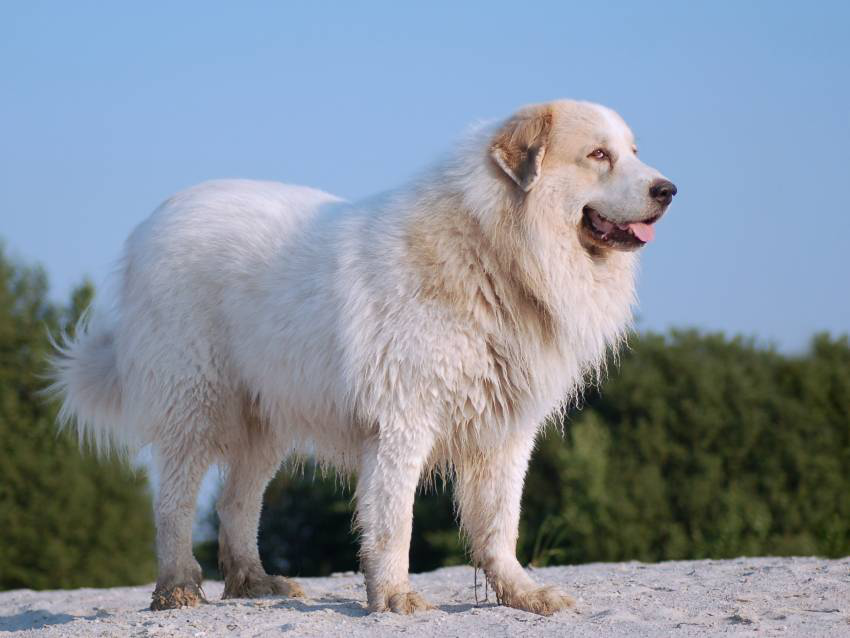

I think that this dog is a ... Great pyrenees.


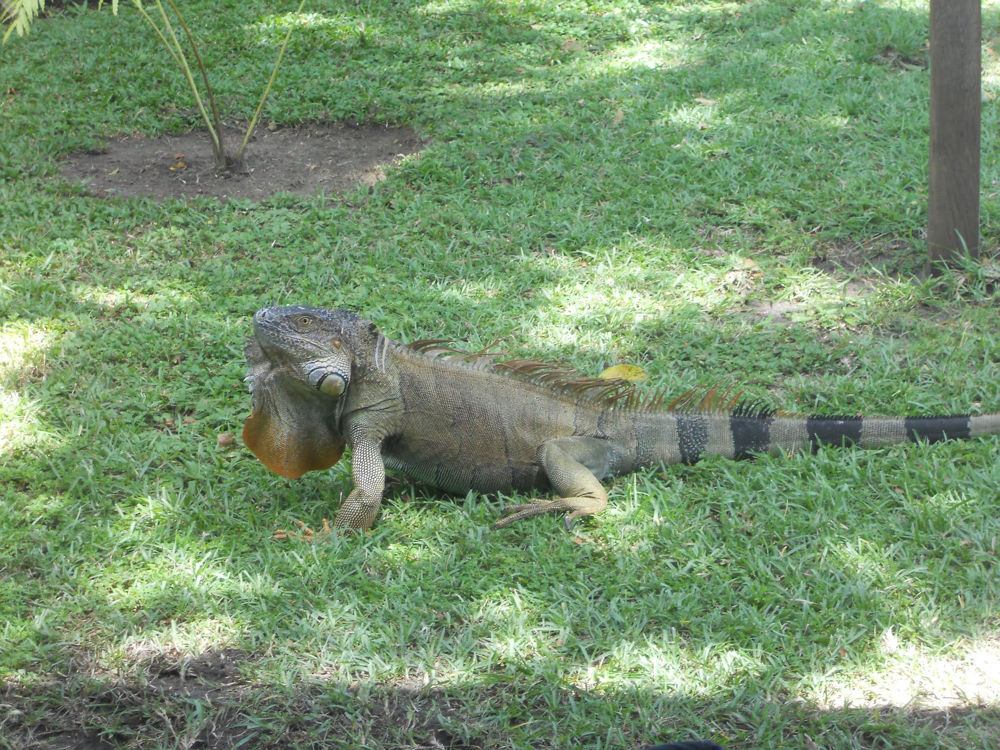

No dog or human detected.


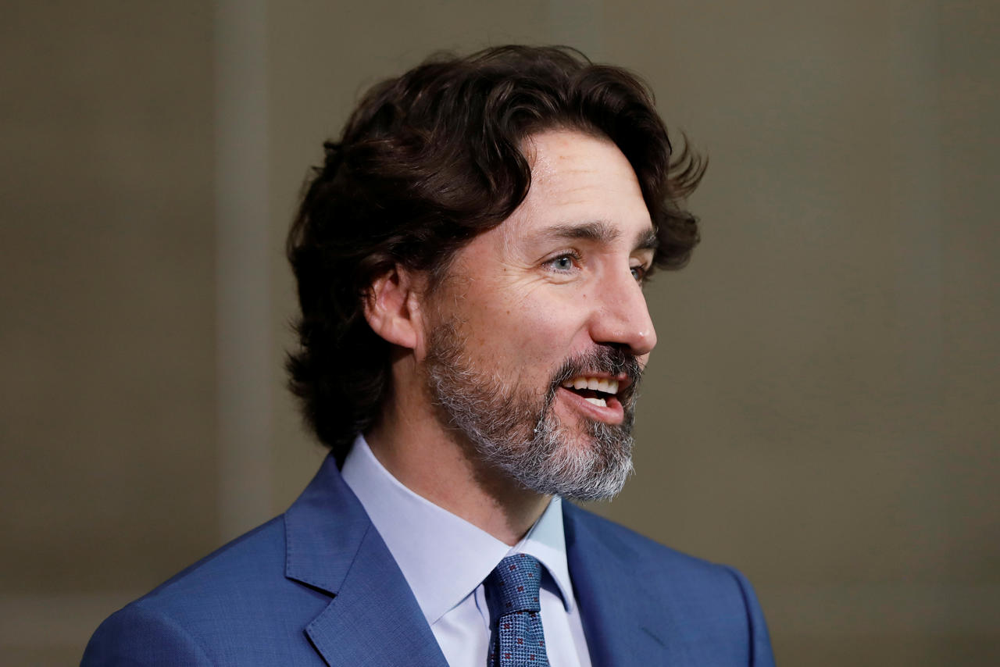

Hello human! If you were a dog, you would be a ... Parson russell terrier


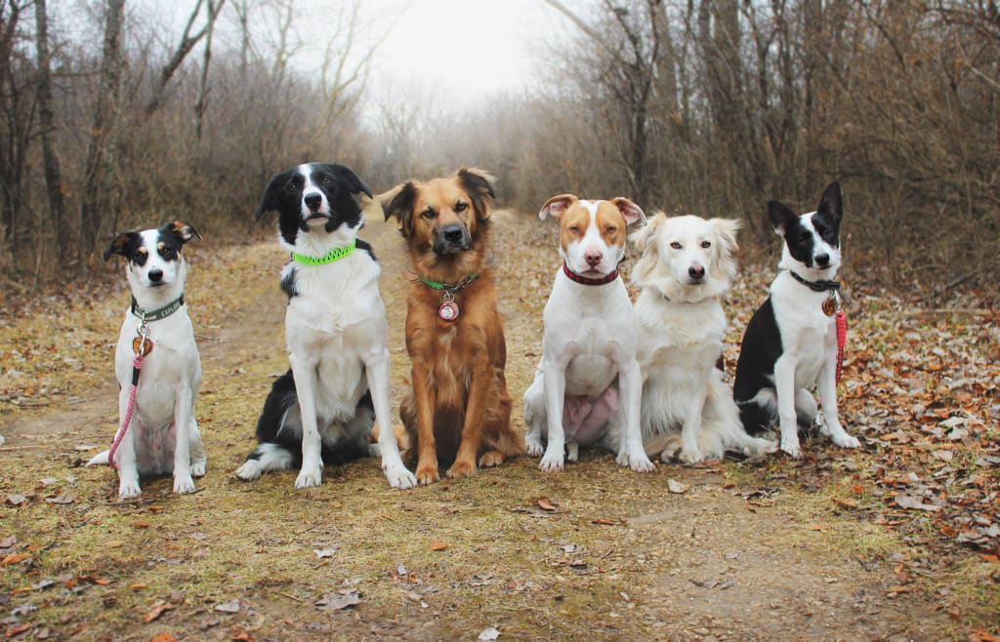

I think that this dog is a ... Bernese mountain dog.


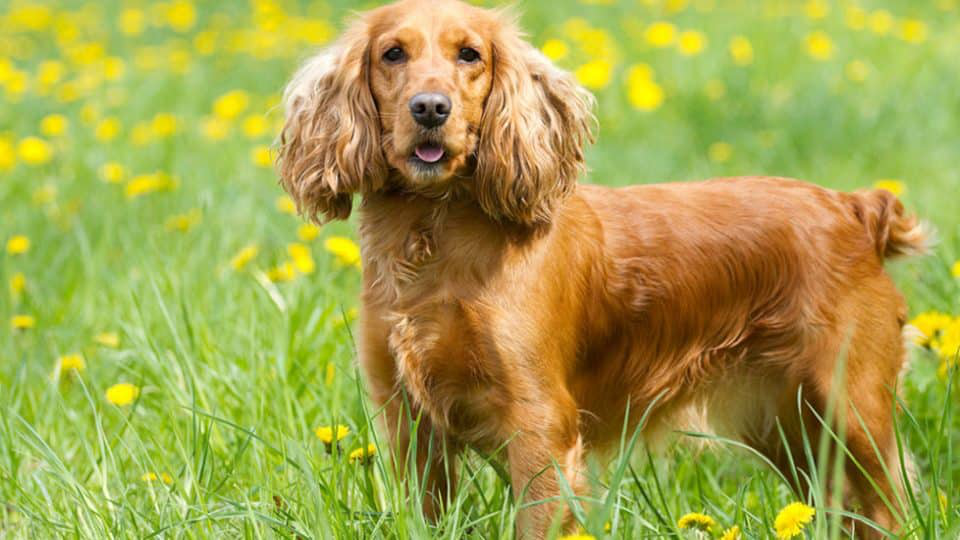

I think that this dog is a ... English cocker spaniel.


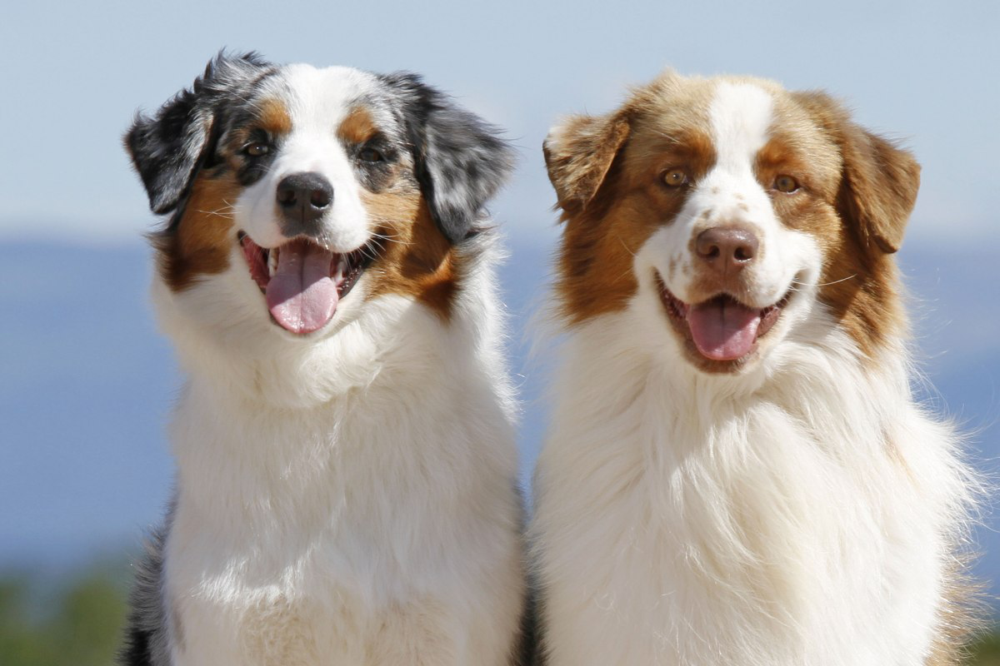

I think that this dog is a ... Australian shepherd.


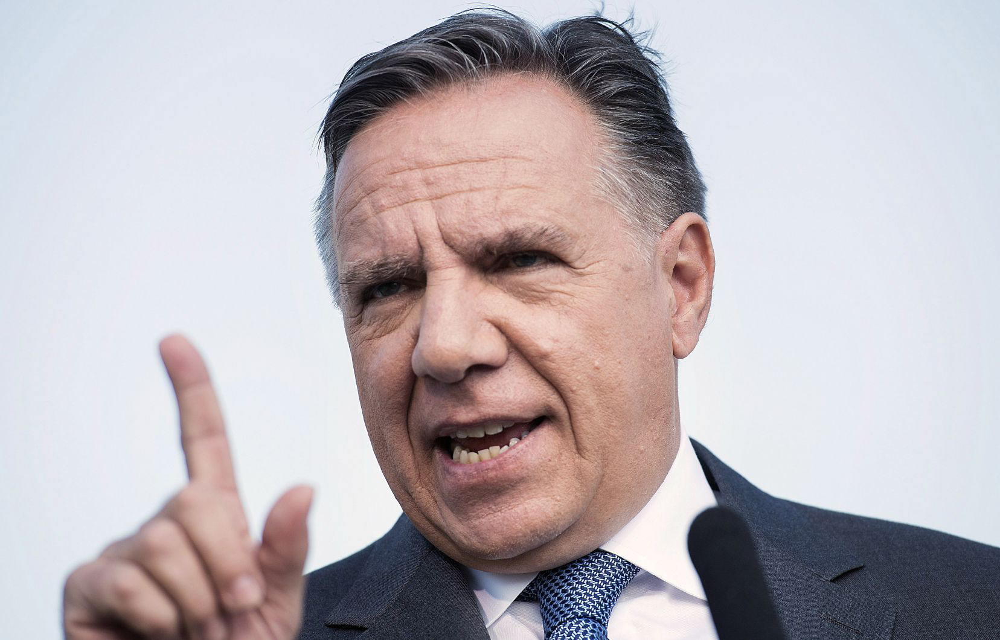

Hello human! If you were a dog, you would be a ... Chihuahua


In [43]:
## TODO: Execute your algorithm from Step 6 on
## at least 6 images on your computer.
## Feel free to use as many code cells as needed.
test_images = np.array(glob("./test_images/*"))

## suggested code, below
# for file in np.hstack((human_files[:3], dog_files[:3])):
for file in test_images:
    run_app(file)